## Step 0: import
必要なものをインポートする



In [1]:
import os
CODE_DIR = 'psp'

In [2]:
from argparse import Namespace
import time
import sys
import pprint
import numpy as np
from PIL import Image
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import cv2

sys.path.append(".")
sys.path.append("..")

from datasets import augmentations
from utils.common import tensor2im, log_input_image
from models.psp import pSp

%matplotlib inline
%load_ext autoreload
%autoreload 2

## Step 1: Select Experiment Type

In [3]:
experiment_type = 'ffhq_encode'

## Step 3: Define Inference Parameters

Below we have a dictionary defining parameters such as the path to the pretrained model to use and the path to the image to perform inference on.
While we provide default values to run this script, feel free to change as needed.

In [4]:
EXPERIMENT_DATA_ARGS = {
    "ffhq_encode": {
        "model_path": "pretrained_models/psp_ffhq_encode.pt",
        "transform": transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    }
}

In [5]:
EXPERIMENT_ARGS = EXPERIMENT_DATA_ARGS[experiment_type]

We need to verify that the model was downloaded correctly. all of our models should weigh approximately 1.12GB.
Note that if the file weighs several KBs, you most likely encounter a "quota exceeded" error from Google Drive. In that case, you should try downloading the model again after a few hours.

## Step 4: Load Pretrained Model
We assume that you have downloaded all relevant models and placed them in the directory defined by the above dictionary.

In [6]:
model_path = EXPERIMENT_ARGS['model_path']
ckpt = torch.load(model_path, map_location='cpu')

In [7]:
# ckpt['latent_avg']

In [8]:
opts = ckpt['opts']
pprint.pprint(opts)

{'batch_size': 8,
 'board_interval': 50,
 'checkpoint_path': None,
 'dataset_type': 'ffhq_encode',
 'device': 'cuda:0',
 'encoder_type': 'GradualStyleEncoder',
 'exp_dir': '',
 'id_lambda': 0.1,
 'image_interval': 100,
 'input_nc': 3,
 'l2_lambda': 1.0,
 'l2_lambda_crop': 0,
 'label_nc': 0,
 'learn_in_w': False,
 'learning_rate': 0.0001,
 'lpips_lambda': 0.8,
 'lpips_lambda_crop': 0,
 'max_steps': 300000,
 'optim_name': 'ranger',
 'resize_factors': None,
 'save_interval': 1000,
 'start_from_latent_avg': True,
 'stylegan_weights': '',
 'test_batch_size': 8,
 'test_workers': 2,
 'train_decoder': False,
 'val_interval': 2500,
 'w_norm_lambda': 0,
 'workers': 8}


In [9]:
# update the training options
opts['checkpoint_path'] = model_path
if 'learn_in_w' not in opts:
    opts['learn_in_w'] = False
if 'output_size' not in opts:
    opts['output_size'] = 1024

In [10]:
opts = Namespace(**opts)
net = pSp(opts)
net.eval()
net.cuda()
print('Model successfully loaded!')

Loading pSp from checkpoint: pretrained_models/psp_ffhq_encode.pt
Model successfully loaded!


In [11]:
img_transforms = EXPERIMENT_ARGS['transform']

## 選択

In [158]:
img_from_dir_base = 'imgs_test/imgs_crop_not_or'
from_dirs = []
for i,file in enumerate(os.listdir(img_from_dir_base)):
    print(f'{i:2}: {file}')
    from_dirs.append(file)
print()
for i,file in enumerate(os.listdir(f"{img_from_dir_base}/ookawa_default-ookawa_angry2")):
    print(f'{i:2}: {file}')

 0: ookawa_default-ookawa_angry2
 1: yotaka_default-yotaka_angry2
 2: yotaka_default-yotaka_smile

 0: crop_eye2_from.png
 1: crop_eye2_mouth_from.png
 2: crop_eye2_mouth_to.png
 3: crop_eye2_to.png
 4: crop_eye_from.png
 5: crop_eye_mouth_from.png
 6: crop_eye_mouth_to.png
 7: crop_eye_to.png
 8: crop_from.png
 9: crop_mouth_from.png
10: crop_mouth_nose_from.png
11: crop_mouth_nose_to.png
12: crop_mouth_to.png
13: crop_to.png


In [244]:
ind_from = 2 # 選択
img_from_dir = img_from_dir_base + f"/{from_dirs[ind_from]}/"
name_from_dir = from_dirs[ind_from]
imgs_from = []
ind_sort = [8,13,4,7,0,3,9,12,5,6,1,2,10,11]
list_files_tmp = sorted(os.listdir(img_from_dir))
list_files = []
for i in ind_sort:
    list_files.append(list_files_tmp[i])
for file in list_files:
    file_path = img_from_dir+file
    img = Image.open(file_path)
    img = img_transforms(img)
    imgs_from.append(img)
imgs_from = torch.stack(imgs_from, dim=0)

In [245]:
img_to_dir = 'imgs_align/'
for i,file in enumerate(os.listdir(img_to_dir)):
  print(f'{i:2}: {file}')

 0: azuki_default.png
 1: ceo_default.png
 2: check1.png
 3: check2.png
 4: danda_default.png
 5: detective.png
 6: detective_02.png
 7: idPhoto.png
 8: mio_happy.png
 9: mio_shock.png
10: mio_silence.png
11: mio_u.png
12: nanko_default.png
13: ookawa_angry.png
14: ookawa_angry2.png
15: ookawa_default.png
16: ookawa_high.png
17: ookawa_regret.png
18: ookawa_smile.png
19: ookawa_surprised.png
20: pharmacist.png
21: saki.png
22: saki_glasses.png
23: sandy.png
24: takebe_default.png
25: test01.png
26: test01_02.png
27: test01_03.png
28: test01_04.png
29: test02.png
30: woman_default.png
31: yotaka_angry.png
32: yotaka_angry2.png
33: yotaka_bald.png
34: yotaka_bushy.png
35: yotaka_default.png
36: yotaka_gj.png
37: yotaka_smile.png
38: yotaka_smile2.png


In [246]:
inds_to = {24,27,30}  # 選択
imgs_to = []
names_to = []
for i,file_name in enumerate(os.listdir(img_to_dir)):
    if i in inds_to:
        names_to.append(os.path.splitext(file_name)[0])
        file_path = img_to_dir+file_name
        img = Image.open(file_path)
        img = img_transforms(img)
        imgs_to.append(img)
imgs_to = torch.stack(imgs_to, dim=0)

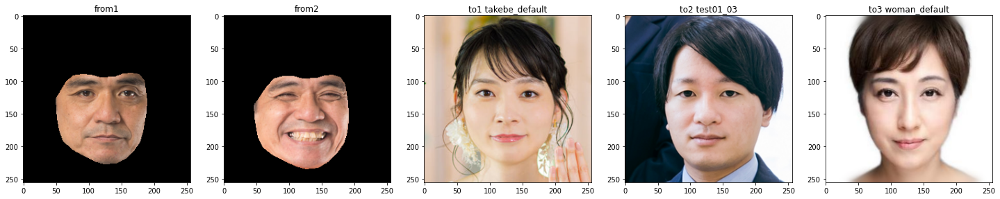

In [247]:
import matplotlib.pyplot as plt

num_to = len(imgs_to)
fig, ax = plt.subplots(1, 2+num_to, figsize=(5*(2+num_to), 5))
for i in range(2):
    ax[i].imshow(imgs_from[i].permute([1, 2, 0]) / 2 + 0.5)
    ax[i].set_title(f"from{i+1}")

for i in range(num_to):
    ax[i+2].imshow(imgs_to[i].permute([1, 2, 0]) / 2 + 0.5)
    ax[i+2].set_title(f"to{i+1} {names_to[i]}")

plt.show()

In [248]:
Ws_from = [] 
Ws_to = []
with torch.no_grad():
    for img in imgs_from:
        w=net.encoder(img.unsqueeze(0).to("cuda").float())
        w=w+ckpt['latent_avg'].to(opts.device).repeat(w.shape[0],1,1)
        Ws_from.append(w)
    for img in imgs_to:
        w=net.encoder(img.unsqueeze(0).to("cuda").float())
        w=w+ckpt['latent_avg'].to(opts.device).repeat(w.shape[0],1,1)
        Ws_to.append(w)

In [249]:
alpha = torch.tensor(np.linspace(0, 1, 11, dtype=np.float32)).to("cuda")

## face-all

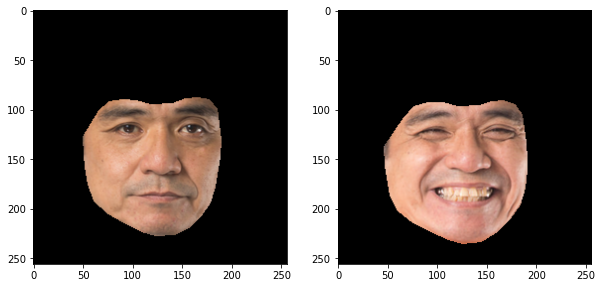

In [250]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(imgs_from[0].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(imgs_from[1].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [251]:
w_change_faceall = Ws_from[1] - Ws_from[0]

preds_faceall = []
preds_faceall_pil = []
with torch.no_grad():
    for w in Ws_to:
        preds_faceall_tmp = []
        preds_faceall_pil_tmp = []
        for alp in alpha:
            w2 = w + alp * w_change_faceall
            pred_image, pred_latent = net.decoder([w2],input_is_latent=True,randomize_noise=False,return_latents=True)
            pred = net.face_pool(pred_image)[0]
            pred_pil = tensor2im(pred)
            preds_faceall_tmp.append(pred*0.5+0.5)
            preds_faceall_pil_tmp.append(pred_pil)
        preds_faceall.append(preds_faceall_tmp)
        preds_faceall_pil.append(preds_faceall_pil_tmp)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

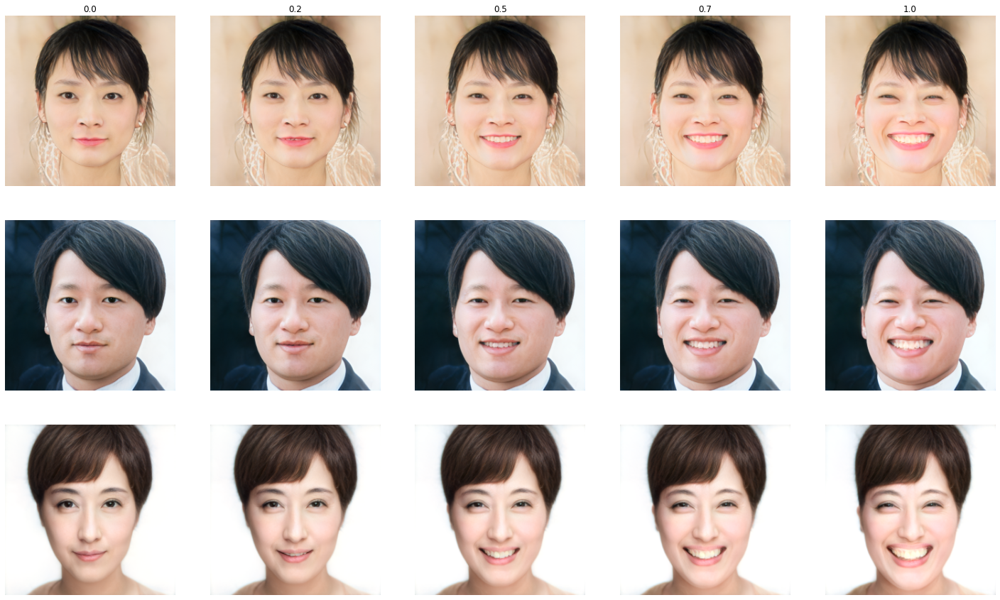

In [252]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_faceall):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_faceall) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

## eye

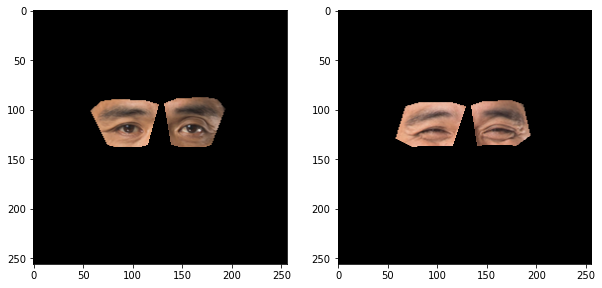

In [253]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(imgs_from[2].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(imgs_from[3].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [254]:
w_change_eye = Ws_from[3] - Ws_from[2]

preds_eye = []
preds_eye_pil = []
with torch.no_grad():
    for w in Ws_to:
        preds_eye_tmp = []
        preds_eye_pil_tmp = []
        for alp in alpha:
            w2 = w + alp * w_change_eye
            pred_image, pred_latent = net.decoder([w2],input_is_latent=True,randomize_noise=False,return_latents=True)
            pred = net.face_pool(pred_image)[0]
            pred_pil = tensor2im(pred)
            preds_eye_tmp.append(pred*0.5+0.5)
            preds_eye_pil_tmp.append(pred_pil)
        preds_eye.append(preds_eye_tmp)
        preds_eye_pil.append(preds_eye_pil_tmp)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

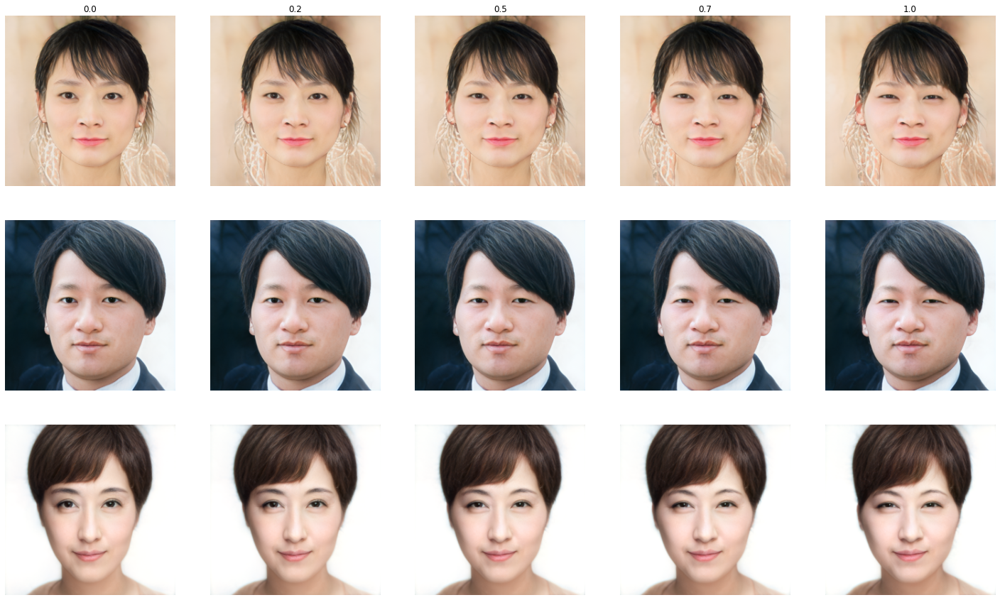

In [255]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_eye):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_eye) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

## eye2

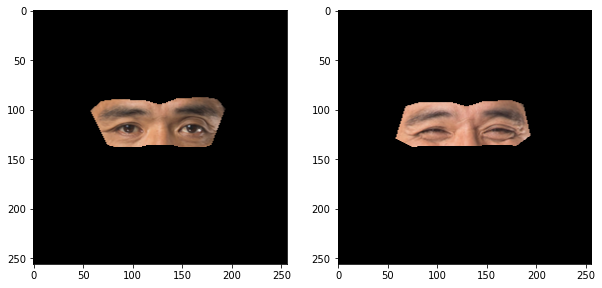

In [256]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(imgs_from[4].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(imgs_from[5].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [257]:
w_change_eye2 = Ws_from[5] - Ws_from[4]

preds_eye2 = []
preds_eye2_pil = []
with torch.no_grad():
    for w in Ws_to:
        preds_eye2_tmp = []
        preds_eye2_pil_tmp = []
        for alp in alpha:
            w2 = w + alp * w_change_eye2
            pred_image, pred_latent = net.decoder([w2],input_is_latent=True,randomize_noise=False,return_latents=True)
            pred = net.face_pool(pred_image)[0]
            pred_pil = tensor2im(pred)
            preds_eye2_tmp.append(pred*0.5+0.5)
            preds_eye2_pil_tmp.append(pred_pil)
        preds_eye2.append(preds_eye2_tmp)
        preds_eye2_pil.append(preds_eye2_pil_tmp)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

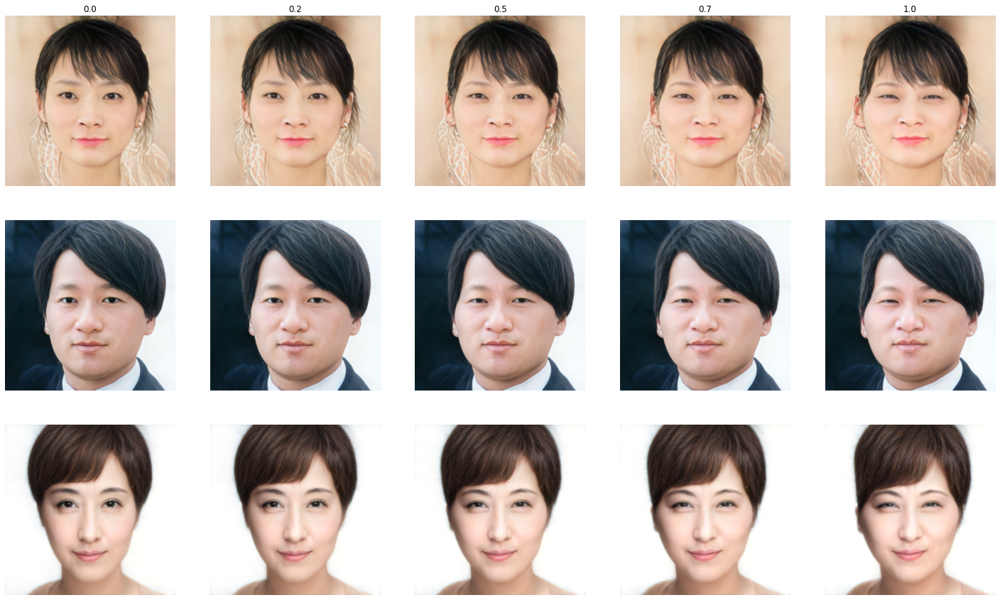

In [258]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_eye2):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_eye2) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

## mouth

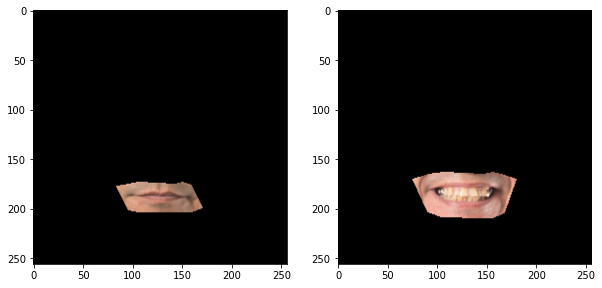

In [259]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(imgs_from[6].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(imgs_from[7].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [260]:
w_change_mouth = Ws_from[7] - Ws_from[6]

preds_mouth = []
preds_mouth_pil = []
with torch.no_grad():
    for w in Ws_to:
        preds_mouth_tmp = []
        preds_mouth_pil_tmp = []
        for alp in alpha:
            w2 = w + alp * w_change_mouth
            pred_image, pred_latent = net.decoder([w2],input_is_latent=True,randomize_noise=False,return_latents=True)
            pred = net.face_pool(pred_image)[0]
            pred_pil = tensor2im(pred)
            preds_mouth_tmp.append(pred*0.5+0.5)
            preds_mouth_pil_tmp.append(pred_pil)
        preds_mouth.append(preds_mouth_tmp)
        preds_mouth_pil.append(preds_mouth_pil_tmp)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

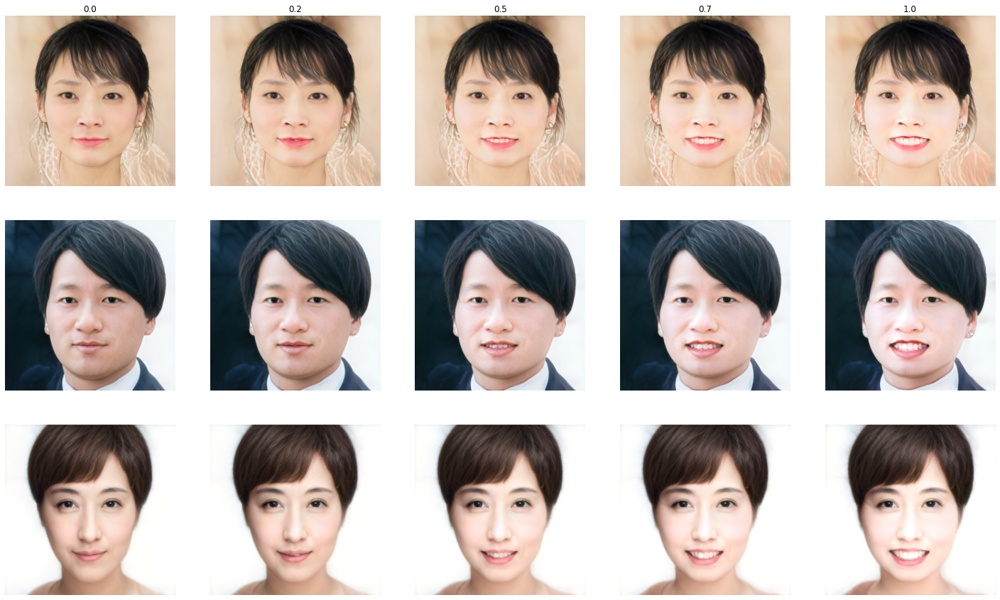

In [261]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_mouth):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_mouth) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

## eye&mouth

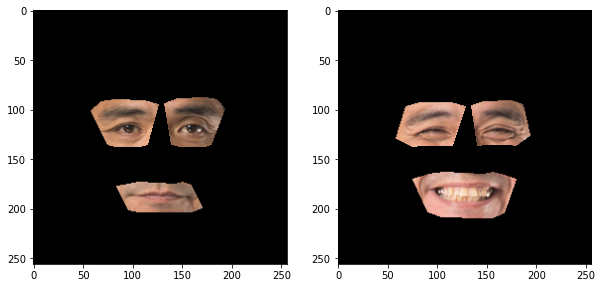

In [262]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(imgs_from[8].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(imgs_from[9].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [263]:
w_change_eyemouth = Ws_from[9] - Ws_from[8]

preds_eyemouth = []
preds_eyemouth_pil = []
with torch.no_grad():
    for w in Ws_to:
        preds_eyemouth_tmp = []
        preds_eyemouth_pil_tmp = []
        for alp in alpha:
            w2 = w + alp * w_change_eyemouth
            pred_image, pred_latent = net.decoder([w2],input_is_latent=True,randomize_noise=False,return_latents=True)
            pred = net.face_pool(pred_image)[0]
            pred_pil = tensor2im(pred)
            preds_eyemouth_tmp.append(pred*0.5+0.5)
            preds_eyemouth_pil_tmp.append(pred_pil)
        preds_eyemouth.append(preds_eyemouth_tmp)
        preds_eyemouth_pil.append(preds_eyemouth_pil_tmp)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

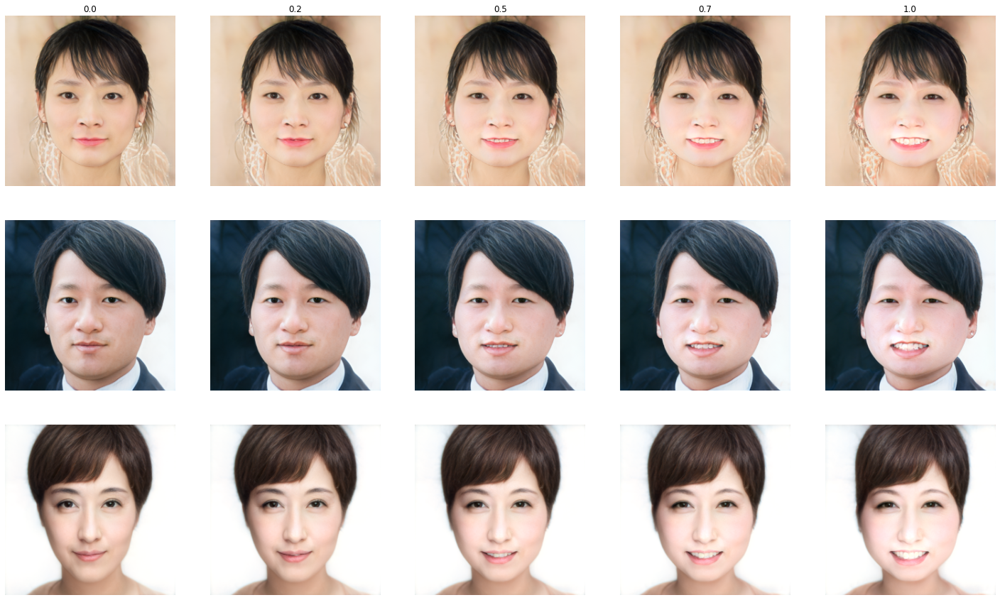

In [264]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_eyemouth):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_eyemouth) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

## eye2&mouth

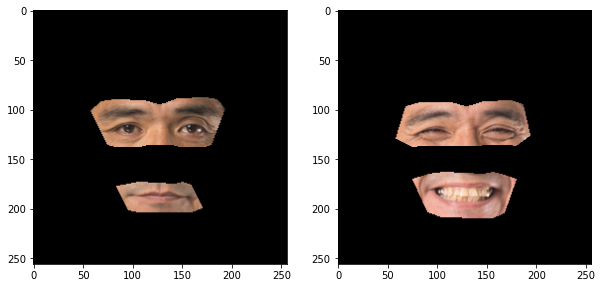

In [265]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(imgs_from[10].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(imgs_from[11].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [266]:
w_change_eye2mouth = Ws_from[11] - Ws_from[10]

preds_eye2mouth = []
preds_eye2mouth_pil = []
with torch.no_grad():
    for w in Ws_to:
        preds_eye2mouth_tmp = []
        preds_eye2mouth_pil_tmp = []
        for alp in alpha:
            w2 = w + alp * w_change_eye2mouth
            pred_image, pred_latent = net.decoder([w2],input_is_latent=True,randomize_noise=False,return_latents=True)
            pred = net.face_pool(pred_image)[0]
            pred_pil = tensor2im(pred)
            preds_eye2mouth_tmp.append(pred*0.5+0.5)
            preds_eye2mouth_pil_tmp.append(pred_pil)
        preds_eye2mouth.append(preds_eye2mouth_tmp)
        preds_eye2mouth_pil.append(preds_eye2mouth_pil_tmp)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

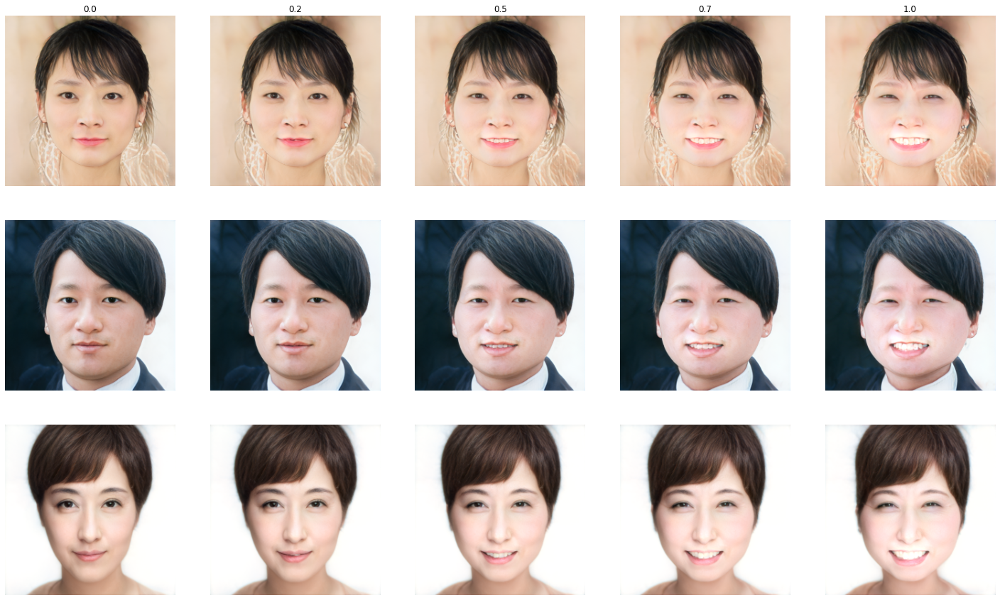

In [267]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_eye2mouth):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_eye2mouth) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

## mouth&nose

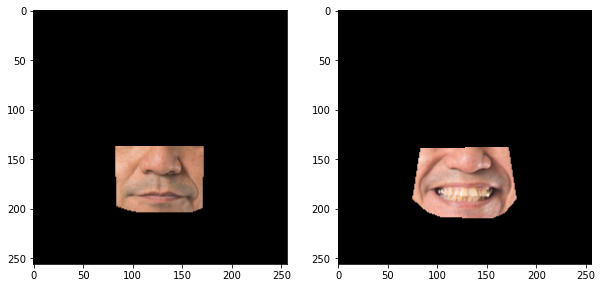

In [268]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(5*2, 5))
ax[0].imshow(imgs_from[12].permute([1, 2, 0]) / 2 + 0.5)
ax[1].imshow(imgs_from[13].permute([1, 2, 0]) / 2 + 0.5)
plt.show()

In [269]:
w_change_mouthnose = Ws_from[13] - Ws_from[12]

preds_mouthnose = []
preds_mouthnose_pil = []
with torch.no_grad():
    for w in Ws_to:
        preds_mouthnose_tmp = []
        preds_mouthnose_pil_tmp = []
        for alp in alpha:
            w2 = w + alp * w_change_mouthnose
            pred_image, pred_latent = net.decoder([w2],input_is_latent=True,randomize_noise=False,return_latents=True)
            pred = net.face_pool(pred_image)[0]
            pred_pil = tensor2im(pred)
            preds_mouthnose_tmp.append(pred*0.5+0.5)
            preds_mouthnose_pil_tmp.append(pred_pil)
        preds_mouthnose.append(preds_mouthnose_tmp)
        preds_mouthnose_pil.append(preds_mouthnose_pil_tmp)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

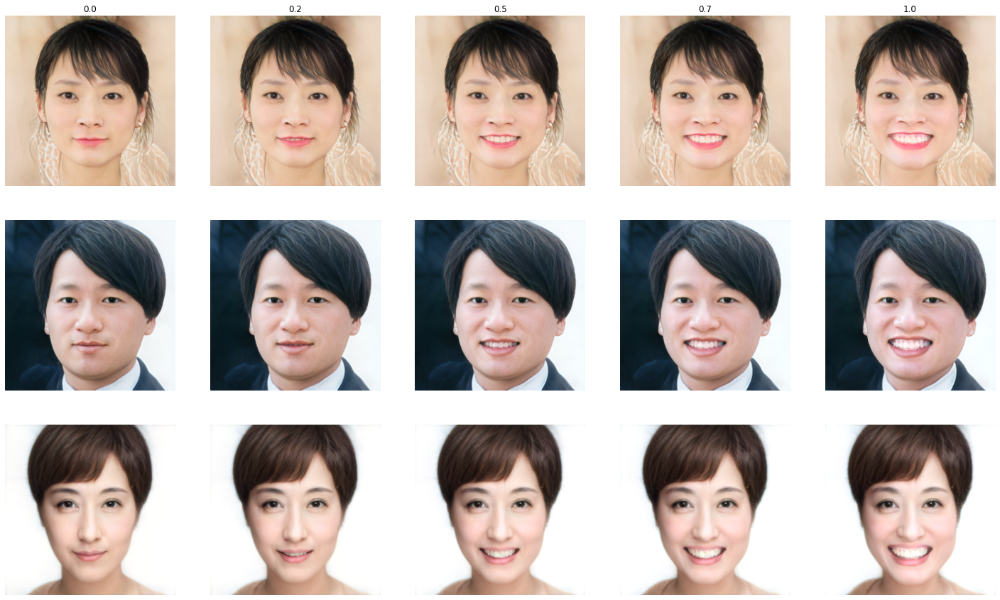

In [270]:
import matplotlib.pyplot as plt

num_show = 5
fig,ax = plt.subplots(num_to, num_show, figsize=(5*num_show, 5*num_to))
for i,pred in enumerate(preds_mouthnose):
    for j,k in enumerate(np.linspace(0,len(pred)-1,num_show,dtype=np.uint8)):
        if len(preds_mouthnose) < 2:
            ax[j].imshow(pred[k].permute(1,2,0).cpu())
            ax[j].set_title(np.array(alpha[k].cpu()))
            ax[j].axis('off')
        else:
            ax[i,j].imshow(pred[k].permute(1,2,0).cpu())
            if i == 0:
                ax[i,j].set_title(np.array(alpha[k].cpu()))
            ax[i,j].axis('off')

## gifの保存

### face-all

In [271]:
dst_dir = f"imgs_test/imgs_parts_transfer_crop_not_or/{name_from_dir}"

preds_faceall_pil_q = []
for preds in preds_faceall_pil:
    preds_tmp = []
    for pred in preds:
        preds_tmp.append(pred.quantize())
    preds_faceall_pil_q.append(preds_tmp)

for i,pred_pil in enumerate(preds_faceall_pil_q):
    dst_dir_parts = f"{dst_dir}/{names_to[i]}/face-all/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

### eye

In [272]:
dst_dir = f"imgs_test/imgs_parts_transfer_crop_not_or/{name_from_dir}"

preds_eye_pil_q = []
for preds in preds_eye_pil:
    preds_tmp = []
    for pred in preds:
        preds_tmp.append(pred.quantize())
    preds_eye_pil_q.append(preds_tmp)

for i,pred_pil in enumerate(preds_eye_pil_q):
    dst_dir_parts = f"{dst_dir}/{names_to[i]}/eye/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

### eye2

In [273]:
dst_dir = f"imgs_test/imgs_parts_transfer_crop_not_or/{name_from_dir}"

preds_eye2_pil_q = []
for preds in preds_eye2_pil:
    preds_tmp = []
    for pred in preds:
        preds_tmp.append(pred.quantize())
    preds_eye2_pil_q.append(preds_tmp)

for i,pred_pil in enumerate(preds_eye2_pil_q):
    dst_dir_parts = f"{dst_dir}/{names_to[i]}/eye2/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

### mouth

In [274]:
dst_dir = f"imgs_test/imgs_parts_transfer_crop_not_or/{name_from_dir}"

preds_mouth_pil_q = []
for preds in preds_mouth_pil:
    preds_tmp = []
    for pred in preds:
        preds_tmp.append(pred.quantize())
    preds_mouth_pil_q.append(preds_tmp)

for i,pred_pil in enumerate(preds_mouth_pil_q):
    dst_dir_parts = f"{dst_dir}/{names_to[i]}/mouth/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

### eye&mouth

In [275]:
dst_dir = f"imgs_test/imgs_parts_transfer_crop_not_or/{name_from_dir}"

preds_eyemouth_pil_q = []
for preds in preds_eyemouth_pil:
    preds_tmp = []
    for pred in preds:
        preds_tmp.append(pred.quantize())
    preds_eyemouth_pil_q.append(preds_tmp)

for i,pred_pil in enumerate(preds_eyemouth_pil_q):
    dst_dir_parts = f"{dst_dir}/{names_to[i]}/eye-mouth/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

### eye2&mouth

In [276]:
dst_dir = f"imgs_test/imgs_parts_transfer_crop_not_or/{name_from_dir}"

preds_eye2mouth_pil_q = []
for preds in preds_eye2mouth_pil:
    preds_tmp = []
    for pred in preds:
        preds_tmp.append(pred.quantize())
    preds_eye2mouth_pil_q.append(preds_tmp)

for i,pred_pil in enumerate(preds_eye2mouth_pil_q):
    dst_dir_parts = f"{dst_dir}/{names_to[i]}/eye2-mouth/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

### mouth&nose

In [277]:
dst_dir = f"imgs_test/imgs_parts_transfer_crop_not_or/{name_from_dir}"

preds_mouthnose_pil_q = []
for preds in preds_mouthnose_pil:
    preds_tmp = []
    for pred in preds:
        preds_tmp.append(pred.quantize())
    preds_mouthnose_pil_q.append(preds_tmp)

for i,pred_pil in enumerate(preds_mouthnose_pil_q):
    dst_dir_parts = f"{dst_dir}/{names_to[i]}/mouth-nose/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    file_name = f"amp{np.array(alpha.detach().cpu())[0]:.2f}_{np.array(alpha.detach().cpu())[-1]:.2f}_{len(alpha)}.gif"
    dst_path = dst_dir_parts + file_name

    pred_pil[0].save(
        dst_path,
        format="gif",
        save_all=True,
        append_images=pred_pil,
        duration=3000//(len(alpha)),
        loop=0,
    )

## 静止画像（フレーム）の保存

### face-all

In [278]:
from torchvision.utils import save_image

dst_dir = f"imgs_test/imgs_parts_transfer_crop_not_or/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,2,4,6,8,10}
for i,pred in enumerate(preds_faceall):
    dst_dir_parts = f"{dst_dir}/{names_to[i]}/face-all/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')

### eye

In [279]:
from torchvision.utils import save_image

dst_dir = f"imgs_test/imgs_parts_transfer_crop_not_or/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,2,4,6,8,10}
for i,pred in enumerate(preds_eye):
    dst_dir_parts = f"{dst_dir}/{names_to[i]}/eye/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')

### eye2

In [280]:
from torchvision.utils import save_image

dst_dir = f"imgs_test/imgs_parts_transfer_crop_not_or/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,2,4,6,8,10}
for i,pred in enumerate(preds_eye2):
    dst_dir_parts = f"{dst_dir}/{names_to[i]}/eye2/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')

### mouth

In [281]:
from torchvision.utils import save_image

dst_dir = f"imgs_test/imgs_parts_transfer_crop_not_or/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,2,4,6,8,10}
for i,pred in enumerate(preds_mouth):
    dst_dir_parts = f"{dst_dir}/{names_to[i]}/mouth/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')

### eye&mouth

In [282]:
from torchvision.utils import save_image

dst_dir = f"imgs_test/imgs_parts_transfer_crop_not_or/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,2,4,6,8,10}
for i,pred in enumerate(preds_eyemouth):
    dst_dir_parts = f"{dst_dir}/{names_to[i]}/eye-mouth/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')

### eye2&mouth

In [283]:
from torchvision.utils import save_image

dst_dir = f"imgs_test/imgs_parts_transfer_crop_not_or/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,2,4,6,8,10}
for i,pred in enumerate(preds_eye2mouth):
    dst_dir_parts = f"{dst_dir}/{names_to[i]}/eye2-mouth/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')

### mouth&nose

In [284]:
from torchvision.utils import save_image

dst_dir = f"imgs_test/imgs_parts_transfer_crop_not_or/{name_from_dir}"
# select_ind = {0,12,24,36,47,59}
select_ind = {0,2,4,6,8,10}
for i,pred in enumerate(preds_mouthnose):
    dst_dir_parts = f"{dst_dir}/{names_to[i]}/mouth-nose/"
    if not os.path.exists(dst_dir_parts): os.makedirs(dst_dir_parts)
    for j,p in enumerate(pred):
        if j in select_ind:
            file_name = f"{dst_dir_parts}amp{np.array(alpha.detach().cpu())[j]:.2f}.png"
            save_image(p, file_name, format='PNG')